<p>
    <a href="https://umt.edu.al/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2024/11/Universiteti-Metropolitan-Tirana.webp" width="200" alt="UMT Logo">
    </a>
</p>
<p>
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo">
    </a>
</p>

**<h1> Libraria Pillow (PIL)</h1>**

Koha e nevojshme: **+60** minuta

<h2>Objektivat</h2>

Përpunimi i imazheve dhe detyrat e shikimit kompjuterik përfshijnë shfaqjen, prerjen, pasqyrimin, rrotullimin, segmentimin e imazhit, klasifikimin, rikuperimin e imazhit, njohjen e imazhit dhe gjenerimin e imazheve. Gjithashtu, puna me imazhet nëpërmjet cloud-it kërkon ruajtjen, transmetimin dhe mbledhjen e imazheve përmes internetit.

Python është një zgjedhje e shkëlqyer, pasi ka shumë mjete për përpunimin e imazheve, biblioteka për shikimin kompjuterik dhe inteligjencën artificiale. Së fundi, ai përmban shumë biblioteka për punën me skedarët në cloud dhe në internet.

Një imazh dixhital është thjesht një skedar në kompjuterin tuaj. Në këtë laborator, do të fitoni një kuptim më të thellë mbi këto skedarë dhe do të mësoni të punoni me ta duke përdorur bibliotekën Pillow (PIL).

<ul>
    <li><a href='#PIL'>Bibliotekat e Imazheve në Python</a>
        <ul>
            <li>Skedarët e Imazheve dhe Rrugët</li>
            <li>Ngarkimi i një Imazhi në Python</li>
            <li>Vizualizimi i një Imazhi</li>
            <li>Imazhe në Skallë Gri, Kuantizimi dhe Kanalet e Ngjyrave</li>
            <li>Imazhet PIL në matricat në NumPy</li>
        </ul>
    </li>
</ul>


Shkarko imazhet për laboratorin:

In [1]:
### Shkarko Imazhet për Laboratorin në Python

import requests

# URL-të për imazhet
urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png"
]

# Përshtatja dhe shkarkimi i imazheve

for url in urls:  
    response = requests.get(url)  # Bën një kërkesë HTTP GET për të marrë përmbajtjen e URL-së
    
    # Hap një skedar me emrin e fundit të rrugës së URL-së dhe e hap në mënyrë binare për shkrim
    with open(url.split("/")[-1], 'wb') as file:  
        file.write(response.content)  # Shkruan përmbajtjen e shkarkuar në skedar



Së pari, le të definojmë një funksion ndihmës për të bashkuar dy imazhe përkrah njëri-tjetrit. Nuk do t'ju duhet ta kuptoni kodin më poshtë në këtë moment, por ky funksion do të përdoret shpesh gjatë këtij tutoriali për të shfaqur rezultatet.

In [2]:
def get_concat_h(im1, im2):
    # Krijo një imazh të ri me gjerësi të barabartë me shumën e gjerësive të dy imazheve dhe lartësi të barabartë me lartësinë e imazhit të parë
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    
    # Ngjit imazhin e parë në pozitat fillestare (0, 0)
    dst.paste(im1, (0, 0))
    
    # Ngjit imazhin e dytë pas imazhit të parë (fillon nga pozita e parë e imazhit të dytë)
    dst.paste(im2, (im1.width, 0))
    
    # Kthe rezultatin, imazhin e bashkuar
    return dst


 ## Skedarët e Imazheve dhe Rrugët


Një imazh ruhet si një skedar në kompjuterin tuaj. Më poshtë, ne e definojmë `my_image` si emrin e skedarit të një file në këtë direktorium.

In [3]:
my_image = "lenna.png"

Një emër skedari përbëhet nga dy pjesë: emri i skedarit dhe shtesa, të ndara nga një pikë (.). Shtesa përcakton formatin e imazhit. Ka dy formate të njohura imazhesh: Joint Photographic Expert Group (ose `.jpg`, `.jpeg`) dhe Portable Network Graphics (ose `.png`). Këto lloje skedarësh e bëjnë më të thjeshtë punën me imazhet. Për shembull, ato kompresojnë imazhin, duke përdorur më pak hapësirë në disqin tuaj për të ruajtur imazhin.

Skedarët e imazheve ruhen në sistemin e skedarëve të kompjuterit tuaj. Vendndodhja e tij përcaktohet duke përdorur një "rrugë", e cila shpesh është unike. Mund të gjeni rrugën e direktoriumit tuaj aktual të punës me modulin `os` të Python-it. Moduli `os` ofron funksione për të ndërvepruar me sistemin e skedarëve, për shembull, krijimin ose heqjen e një direktorie (folderi), listimin e përmbajtjes së saj, ndryshimin dhe identifikimin e direktoriumit aktual të punës.

In [4]:
# Importo modulin 'os', i cili ofron funksione për ndërveprim me sistemin e skedarëve dhe operacionet tjera të sistemit operativ
import os

# Merr rrugën e direktoriumit aktual të punës dhe e ruan atë në variablin 'cwd'
cwd = os.getcwd()

# Shfaq vlerën e ruajtur në variablin 'cwd', që është rruga e direktoriumit aktual të punës
cwd


'C:\\DIP\\1'

Rruga (path) e një imazhi mund të gjendet duke përdorur këtë vijë kodi:

In [16]:
image_path = os.path.join(cwd, my_image)
image_path

'C:\\DIP\\1\\lenna.png'

## Ngarkimi i imazheve ne python:

Libraria **Pillow (PIL)** është një librari popullore për ngarkimin e imazheve në Python. Përveç kësaj, shumë libra të tjerë si **Keras** dhe **PyTorch** përdorin këtë librari për të punuar me imazhe. Moduli `Image` ofron funksione për të ngarkuar imazhe nga dhe për të ruajtur imazhe në sistemin e skedarëve. Le të importojmë atë nga `PIL`.

In [5]:
from PIL import Image

Nëse imazhi është në direktoriumin aktual të punës, mund ta ngarkoni imazhin si më poshtë duke përdorur emrin e skedarit të imazhit dhe të krijoni një objekt PIL Image:

In [6]:
image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

Gjithashtu nëse po punoni në një mjedis Jupyter, mund ta shihni imazhin duke thirrur vetë variablën.

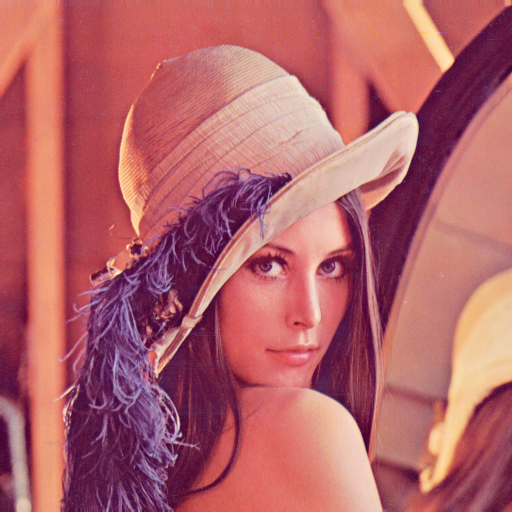

In [7]:
image

## Plotimi i nje imazhi

Ne mund të përdorim gjithashtu metodën `show` të objekteve PIL për të shfaqur imazhin. Ju lutemi vini re se kjo metodë mund të funksionojë ose jo në varësi të konfigurimit tuaj.

In [8]:
image.show()

Mund të përdorni gjithashtu metodën `imshow` nga libraria **matplotlib** për të shfaqur imazhin.

In [11]:
import matplotlib.pyplot as plt

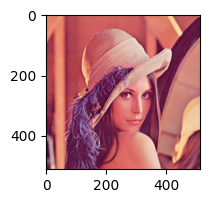

In [13]:
plt.figure(figsize=(2,2))
plt.imshow(image)
plt.show()

Mund të ngarkoni gjithashtu imazhin duke përdorur rrugën e tij të plotë. Kjo është shumë e dobishme nëse imazhi nuk ndodhet në direktoriumin tuaj të punës.

In [17]:
image = Image.open(image_path)

Mund të përdorim atributet e objektit të imazhit për të marrë informacion. Atributi **format** është shtesa ose formati i imazhit.

Atributi **`size`** kthen një tuple, ku elementi i parë është numri i pikselëve që përbëjnë gjerësinë dhe elementi i dytë është numri i pikselëve që përbëjnë lartësinë e imazhit.

In [18]:
print(image.size)

(512, 512)


Kjo është një varg që specifikon formatin e pikselëve të përdorur. Në këtë rast, është “RGB”. RGB është një hapësirë ngjyrash ku e kuqja, e gjelbra dhe e kaltra shtohen së bashku për të prodhuar ngjyra të tjera.


In [19]:
print(image.mode)

RGB


Metoda **`Image.open`** nuk ngarkon të dhënat e imazhit në memorien e kompjuterit. Metoda **`load`** e objektit **PIL** lexon përmbajtjen e skedarit, e dekodon dhe e zgjeron imazhin në memorie.

In [20]:
im = image.load()

Mund të kontrollojmë pastaj intensitetin e imazhit në kolonën e $x$-it dhe rreshtin e $y$-it:

In [21]:
x = 0
y = 1
im[y,x]

(226, 137, 125)

Ne do të përdorim formën e array për të aksesuar elementët; ajo është paksa ndryshe.

Mund ta ruani imazhin në formatin `jpg` duke përdorur komandën e mëposhtme:

In [22]:
image.save("lenna.jpg")

## Imazhe në Shkallë Gri, Kuantizimi dhe Kanalet e Ngjyrave

### Imazhe në Shkallë Gri

Moduli **`ImageOps`** përmban disa operacione të gatshme për përpunimin e imazheve. Ky modul është disi eksperimental, dhe shumica e operatorëve funksionojnë vetëm me imazhe në shkallë gri dhe/ose imazhe RGB.

In [23]:
from PIL import ImageOps 

Imazhet në shkallë gri kanë vlera pikselesh që përfaqësojnë sasinë e dritës ose intensitetin e atij pikseli. Ngjyrat e lehta të gri kanë një intensitet të lartë, ndërsa ngjyrat më të errëta kanë një intensitet më të ulët, dmth, e bardha ka intensitetin më të lartë dhe e zeza intensitetin më të ulët.

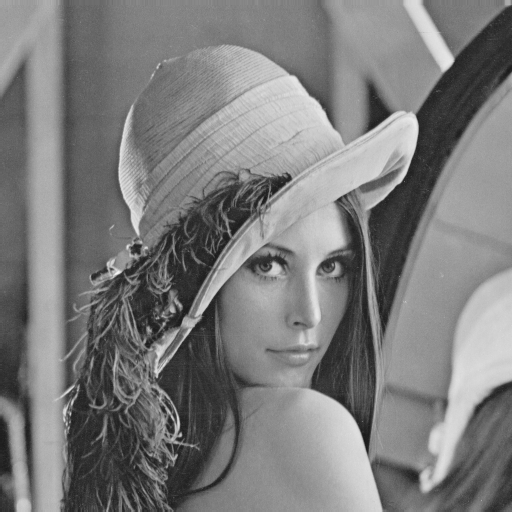

In [24]:
image_gray = ImageOps.grayscale(image) 
image_gray 

Mjeti (mode) është `L` për imazhe në shkallë gri.

In [25]:
image_gray.mode

'L'

### Kuantizimi

Kvantizimi i një imazhi është numri i vlerave unike të intensitetit që mund të marrë çdo piksel i caktuar i imazhit. Për një imazh në shkallë gri, kjo do të thotë numri i nuancave të ndryshme të gri. Shumica e imazheve kanë 256 nivele të ndryshme. Ju mund të ulni nivelet duke përdorur metodën **`quantize`**. Le të zvogëlojmë përsëritshëm numrin e niveleve në gjysmën e tij dhe të vëzhgojmë se çfarë ndodh:

Përgjysmimi i niveleve nuk bën ndonjë ndryshim të dukshëm.

In [26]:
image_gray.quantize(256 // 2)
image_gray.show()

Le të vazhdojmë duke ndarë numrin e vlerave me dy dhe të krahasojmë atë me imazhin origjinal.

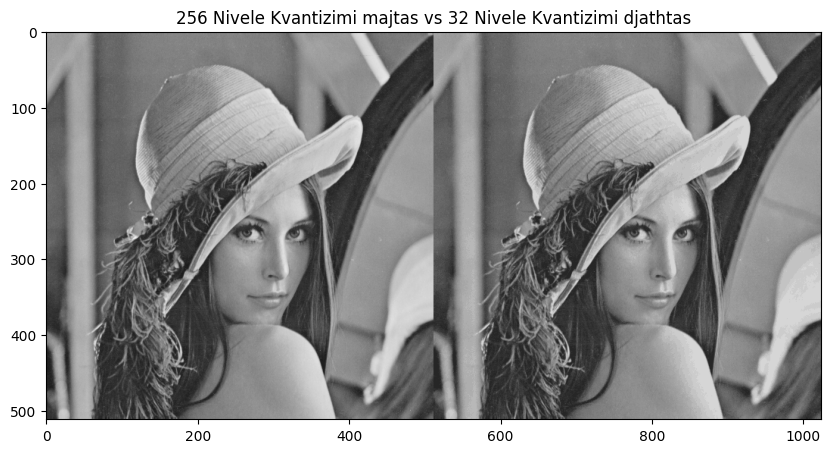

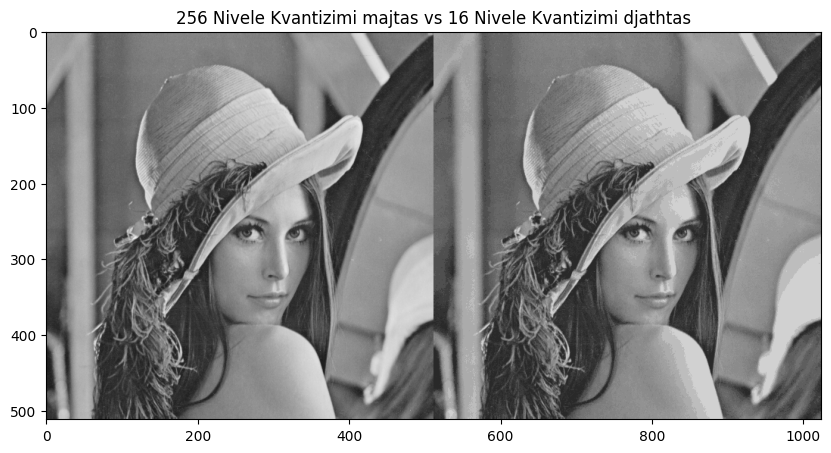

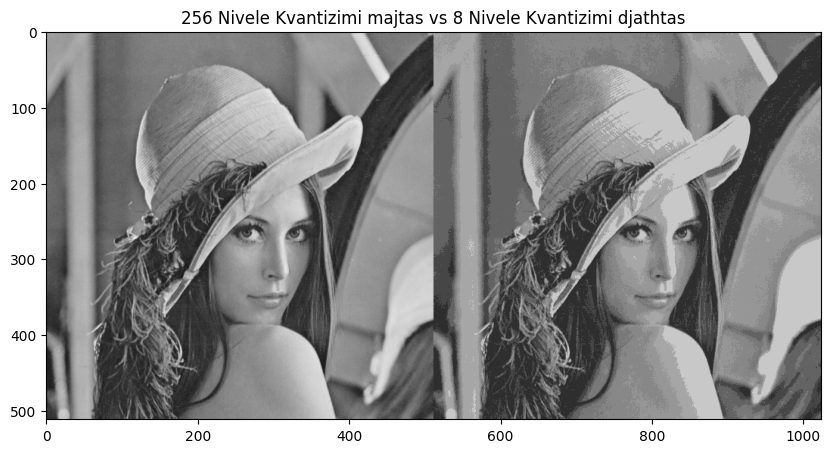

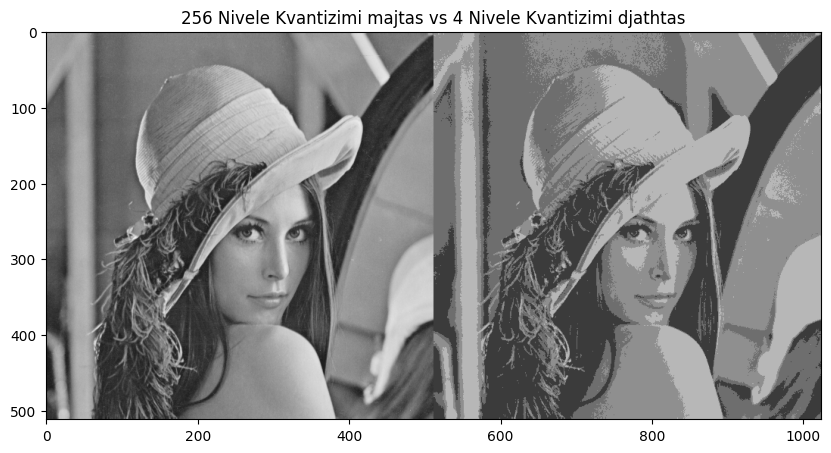

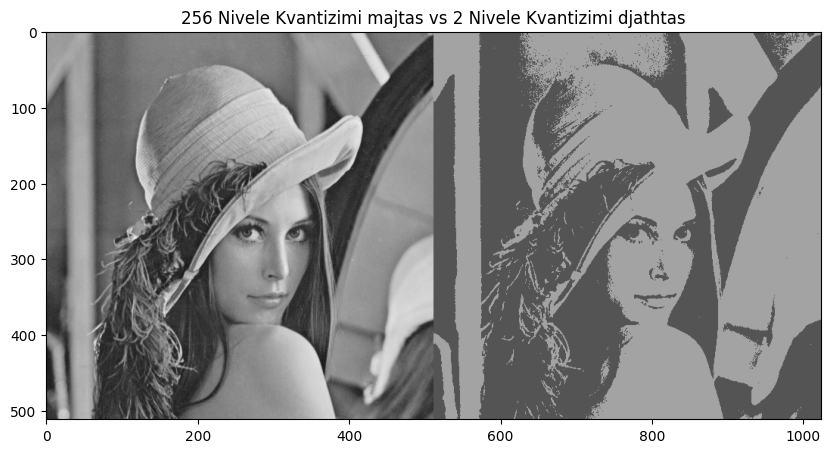

In [27]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 

for n in range(3, 8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
    plt.title("256 Nivele Kvantizimi majtas vs {} Nivele Kvantizimi djathtas".format(256//2**n))
    plt.show()


### Kanalet e Ngjyrave

Ne mund të punojmë gjithashtu me kanalet e ndryshëm të ngjyrave. Merrni parasysh imazhin në vijim:

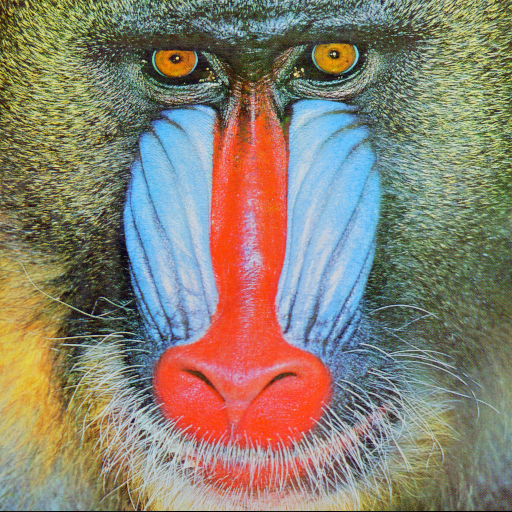

In [28]:
baboon = Image.open('baboon.png')
baboon

Ne mund të marrim kanalet e ndryshëm të ngjyrave RGB dhe t'i caktojmë ato në variablat <code>red</code>, <code>green</code>, dhe <code>blue</code>:

In [29]:
red, green, blue = baboon.split()

Kur shfaqim imazhin me ngjyra pranë kanalit të kuq si një imazh bardhë e zi, vërejmë se rajonet me ngjyrë të kuqe kanë vlera më të larta të intensitetit.

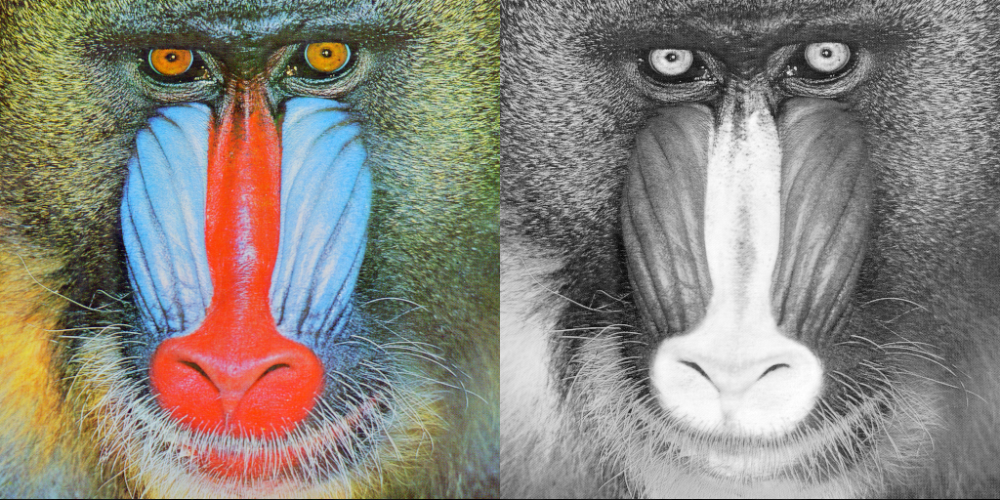

In [30]:
get_concat_h(baboon, red)

Mund të bëjmë të njëjtën gjë edhe për kanalet blu dhe jeshile:

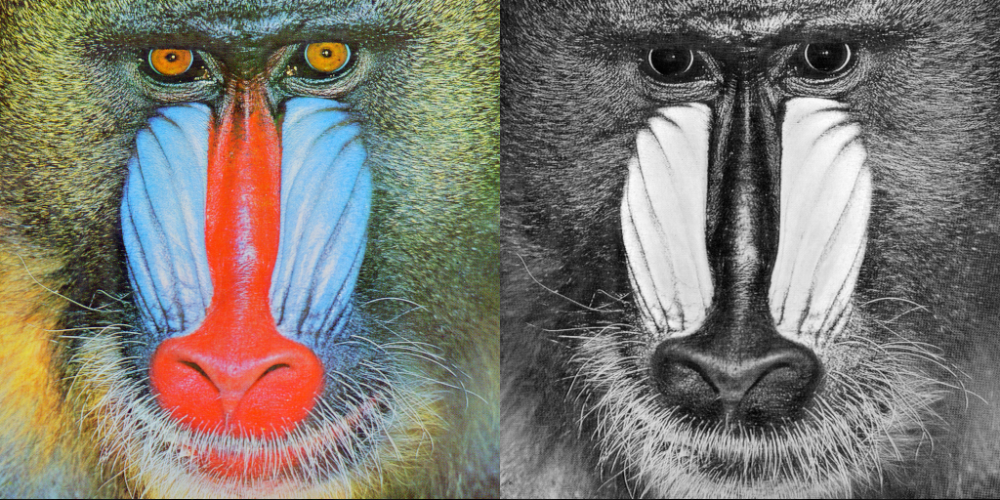

In [32]:
get_concat_h(baboon, blue)

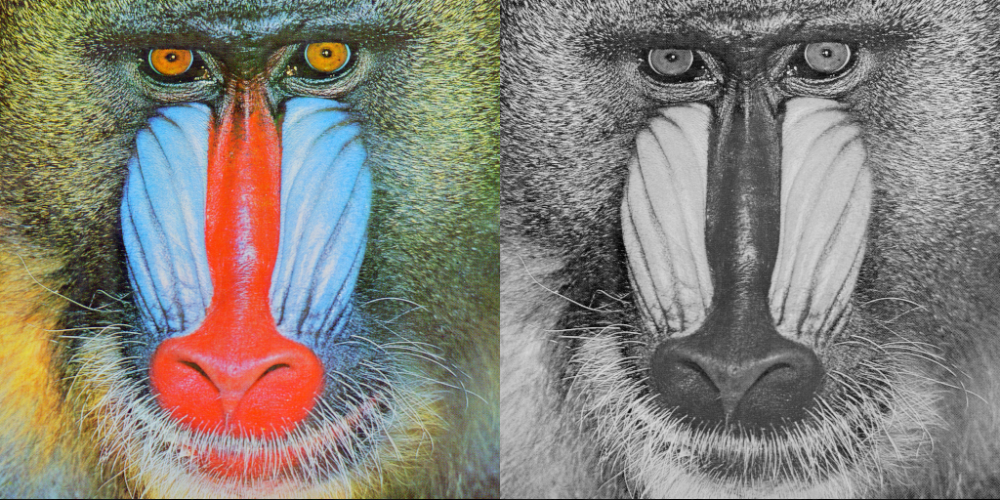

In [33]:
get_concat_h(baboon, green)

## Imazhet PIL nëmatrrica të NumPy

NumPy është një bibliotekë për Python që ju lejon të punoni me array dhe matrica me shumë dimensione. Mund të konvertojmë një imazh PIL në një array NumPy. Përdorim funksionin <code>asarray()</code> ose <code>array</code> nga NumPy për të kthyer imazhet PIL në array NumPy.

Së pari, le të importojmë bibliotekën NumPy:

In [31]:
import numpy as np

E aplikojmë atë në imazhin <code>PIL</code> dhe marrim një array NumPy:

In [35]:
array= np.array(image)
print(type(array))

<class 'numpy.ndarray'>


`np.asarray` e shndërron imazhin origjinal në një array NumPy. Shpesh, nuk duam ta manipulojmë drejtpërdrejt imazhin, por në vend të kësaj, krijojmë një kopje të imazhit për ta modifikuar. Metoda `np.array` krijon një kopje të re të imazhit, në mënyrë që ai origjinal të mbetet i pandryshuar.

In [33]:
array = np.array(image)

Atributi <code>shape</code> i një objekti `numpy.array` kthen një tuple që korrespondon me dimensionet e tij. Elementi i parë tregon numrin e rreshtave ose lartësinë e imazhit, elementi i dytë tregon numrin e kolonave ose gjerësinë e imazhit, dhe elementi i fundit tregon numrin e kanaleve të ngjyrave.

In [34]:
print(array.shape)

(512, 512, 3)


Ose <code>(rreshta, kolona, ngjyra)</code>. Çdo element në aksin e ngjyrave korrespondon me vlerën në formatin <code>(R, G, B)</code>.

Mund të shikojmë vlerat e intensitetit duke printuar vargun, ato variojnë nga 0 deri në 255 ose $2^{8}$ (8-bit).

In [35]:
print(array)

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


Vlerat e intensitetit janë të tipit të dhënash të pavaruara 8-bit.

In [36]:
array[0, 0]

array([226, 137, 125], dtype=uint8)

Mund të gjejmë vlerën maksimale dhe minimale të intensitetit të vargut:

In [37]:
array.min()

3

In [38]:
array.max()

255

### Indeksimi

Indeksimi në Python përdoret për të aksesuar elementët brenda një array ose një liste. Për një imazh të përfaqësuar si një array NumPy, mund të përdorim indekse për të aksesuar vlera të caktuara të pikseleve të imazhit, si dhe për të manipulua me kanalet e ngjyrave individuale.

Mund ta vizualizojm matrricen si një imazh:

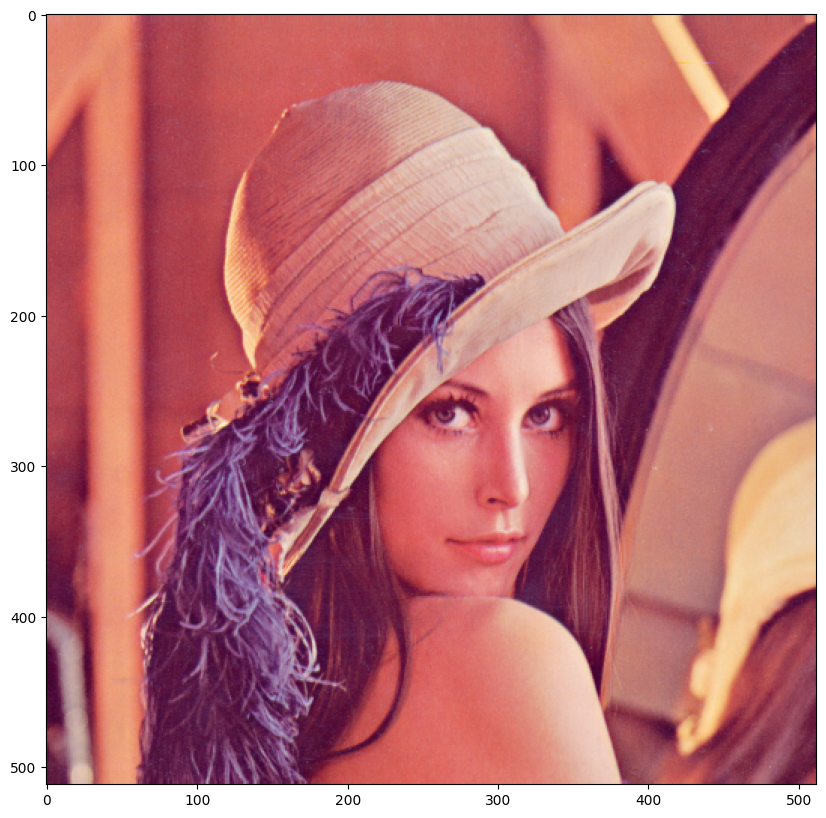

In [40]:
plt.figure(figsize=(10,10))
plt.imshow(array)


Mund të përdorim `slicing` në `numpy`, për shembull, mund të kthejmë 256 rreshtat e parë që përkojnë me gjysmën e sipërme të imazhit:

In [42]:
rows = 256

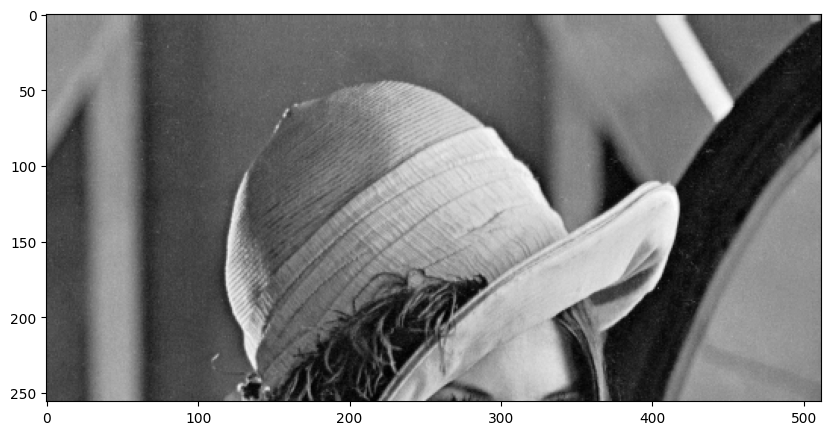

In [43]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,1], 'gray')
plt.show()

Mund të kthejmë gjithashtu 256 kolona të para që përkojnë me gjysmën e parë të imazhit.

In [44]:
columns = 256

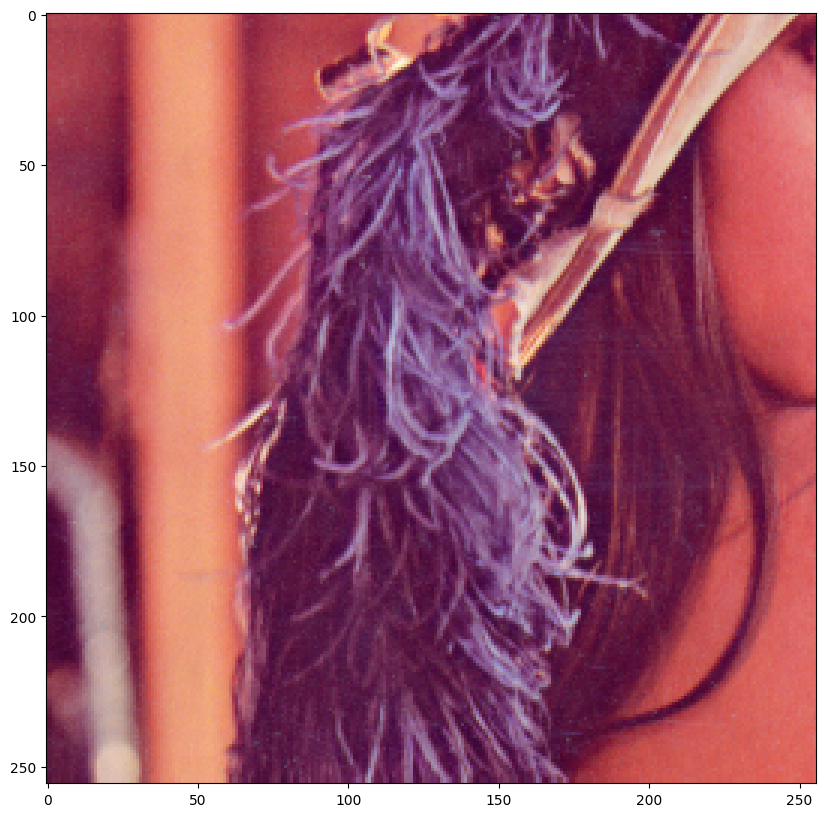

In [45]:
plt.figure(figsize=(10,10))
plt.imshow(array[256:,0:columns,:])
plt.show()

Nëse dëshironi të ri-dassignoni një array në një variabël tjetër, duhet të përdorni metodën `copy` (do ta trajtojmë këtë në seksionin tjetër).

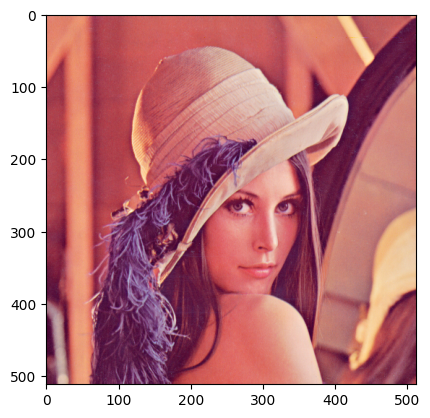

In [46]:
A = array.copy()
plt.imshow(A)
plt.show()

Nëse nuk e aplikojmë metodën `copy()`, variabli do të tregojë për në të njëjtën vendndodhje në memorje. Merrni për shembull array-n B. Nëse vendosim të gjitha vlerat e array-t A në zero, pasi B tregon për A-n, edhe vlerat e B do të jenë zero:

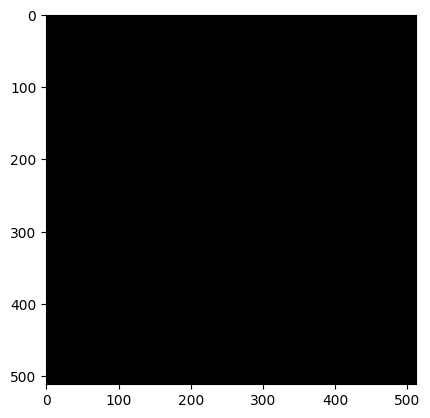

In [47]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

Ne mund të punojmë gjithashtu me kanalet e ndryshme të ngjyrave. Merrni për shembull imazhin e babuanit:

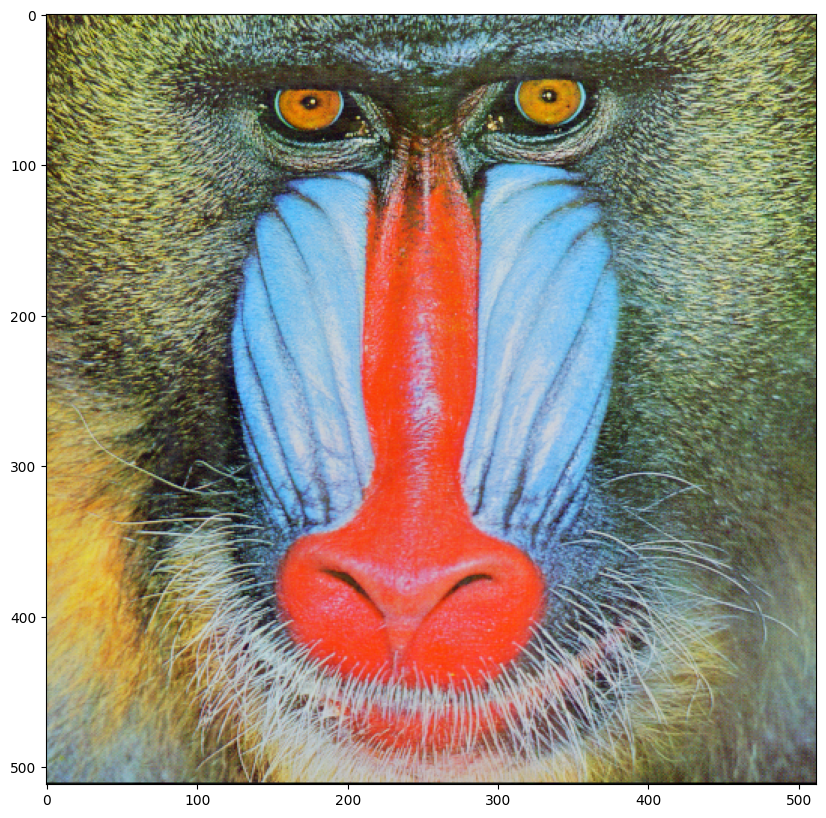

In [48]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

Ne mund ta vizualizojmë kanalin e kuq si vlera intensiteti të kanalit të kuq.

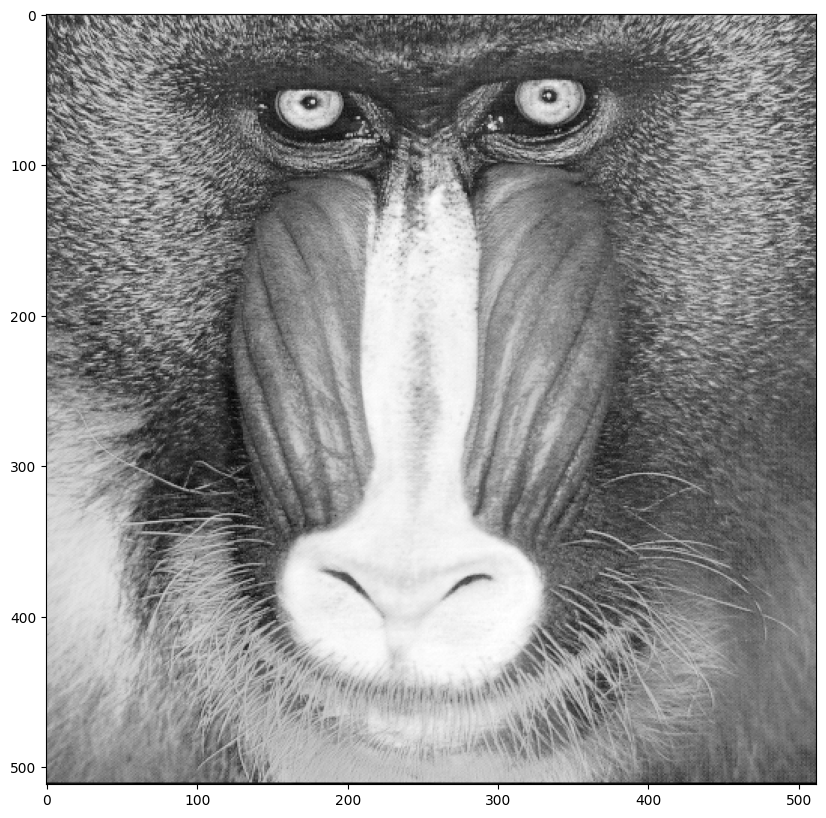

In [49]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], 'gray')
plt.show()

Ose mund të krijojmë një array të ri dhe të vendosim të gjitha kanalet përveç kanalit të kuq në zero. Pra, kur e shfaqim imazhin, ai do të duket i kuq:

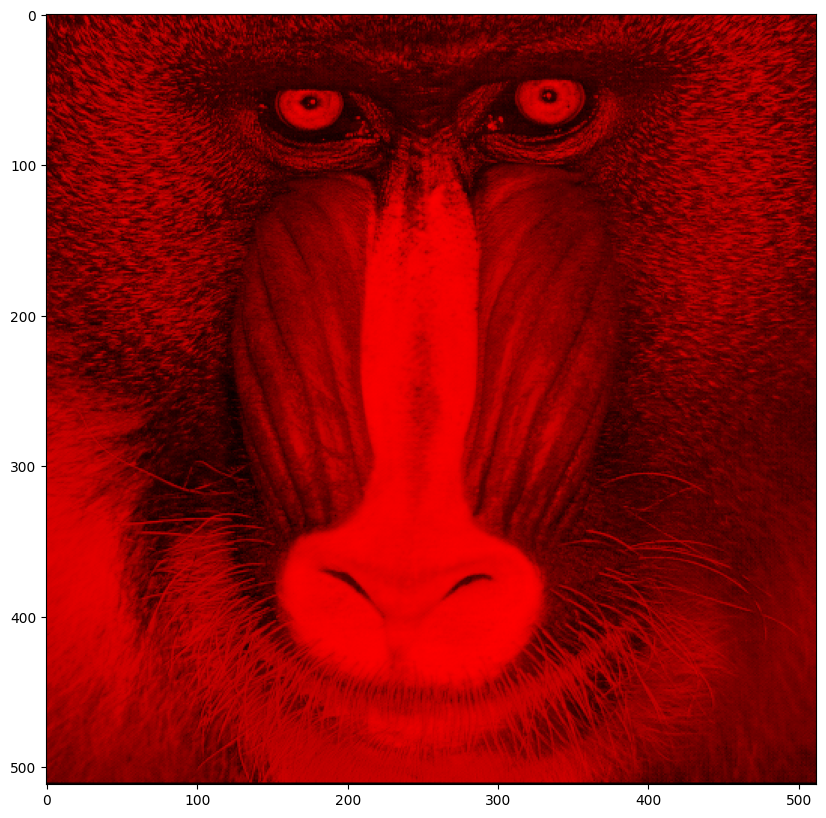

In [50]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

Ne mund te bejm te njejten edhe per blun

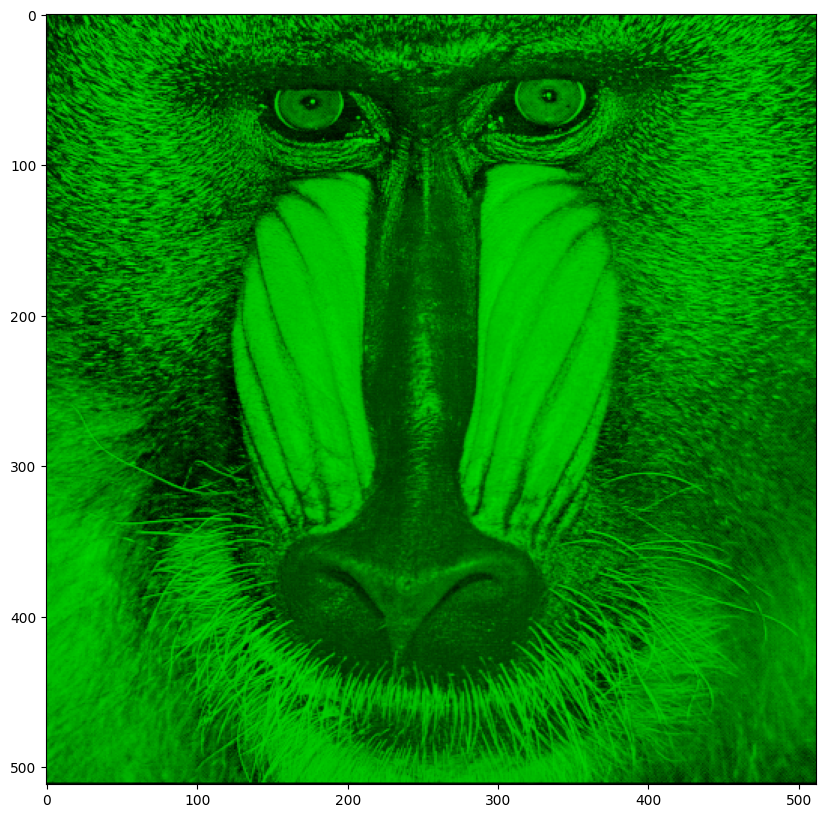

In [52]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

## Pyetje 1:
Përdorni imazhin `lenna.png` nga ky laborator ose merrni ndonjë imazh që ju pëlqen.

Hapni imazhin dhe krijoni një objekt PIL Image të quajtur `blue_lenna`, konvertoni imazhin në një array numpy që mund ta manipulojmë dhe quajeni `blue_array`, nxirrni kanalin blu nga ai, dhe së fundmi shfaqni imazhin.

Klikoni dy herë **këtu** për një sugjerim.

<!-- Sugjerimi është më poshtë: 
    blue_array[:,:,2] = 0 
    
-->


Klikoni dy herë **këtu** për zgjidhjen:
<!-- Pergjigja eshte me poshte:

blue_lenna = Image.open('lenna.png')
blue_array = np.array(blue_lenna)
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

-->

# References 


[1]  Imazhet jan marre nga: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

<h3 align="center"> &#169; UMT. All rights reserved. <h3/>

image id: 1


TypeError: Image data of dtype object cannot be converted to float

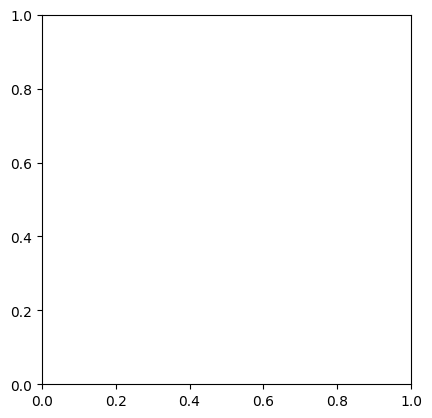

In [81]:
k = ['1.jpg', '2.jpg']
folde = 'C:\DIP\1'

for i in range(0, 2):

    image_path = os.path.join(folde, k[i])

    im = cv2.imread(image_path)

    print(f'image id: {i+1}')
    plt.imshow(im)
    plt.show()

image id:1


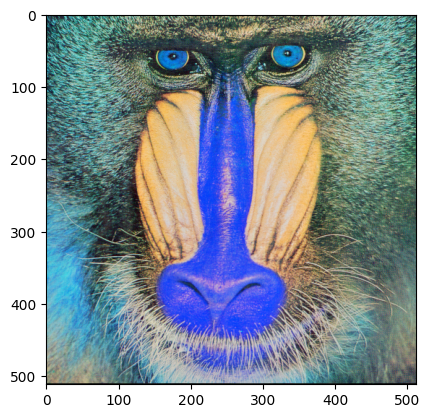

image id:2


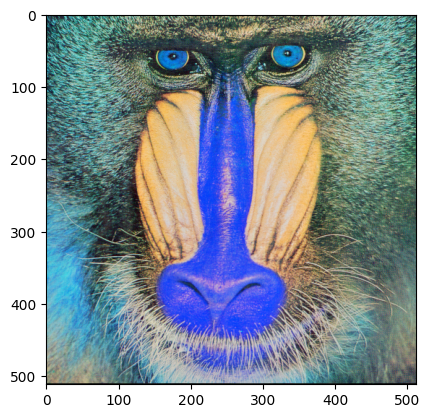

In [94]:
k = ['1.png', '2.png']
import cv2
folde = 'C:\\DIP\\1\\'
for i in range(0,2):
    
    image_path = os.path.join(folde,k[i] )
    
    im = cv2.imread(image_path)
    print(f'image id:{i+1}')
    plt.imshow(im, 'gray')
    plt.show()
    

In [85]:
image_path

'C:\\DIP\\1\\1.jpg'